<a href="https://colab.research.google.com/github/aztecman/DataLit/blob/master/NODEs_DEMO.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## PyTorch Implementation of Differentiable ODE Solvers: Demo

### School of AI - DataLit Week 9

#### Any mistakes made here are the sole property of I, Carson Bentley

Sources:
- https://github.com/rtqichen/torchdiffeq
- https://stackoverflow.com/questions/9012487/matplotlib-pyplot-savefig-outputs-blank-image
- https://stackoverflow.com/questions/753190/programmatically-generate-video-or-animated-gif-in-python
- https://github.com/ipython/ipython/issues/10045

In [0]:
!git clone https://github.com/rtqichen/torchdiffeq.git

fatal: destination path 'torchdiffeq' already exists and is not an empty directory.


In [0]:
cd torchdiffeq

/content/torchdiffeq


In [0]:
pip install -e .

Obtaining file:///content/torchdiffeq
  Found existing installation: torchdiffeq 0.0.1
    Can't uninstall 'torchdiffeq'. No files were found to uninstall.
  Running setup.py develop for torchdiffeq


In [0]:
import os
#import argparse
import time
import numpy as np

import torch
import torch.nn as nn
import torch.optim as optim

In [0]:
#parser = argparse.ArgumentParser('ODE demo')
#parser.add_argument('--method', type=str, choices=['dopri5', 'adams'], default='dopri5')
#parser.add_argument('--data_size', type=int, default=1000)
#parser.add_argument('--batch_time', type=int, default=10)
#parser.add_argument('--batch_size', type=int, default=20)
#parser.add_argument('--niters', type=int, default=2000)
#parser.add_argument('--test_freq', type=int, default=20)
#parser.add_argument('--viz', action='store_true')
#parser.add_argument('--gpu', type=int, default=0)
#parser.add_argument('--adjoint', action='store_true')
#args = parser.parse_args()

In [0]:
method = 'dopri5'
data_size = 1000
batch_time = 10
batch_size = 20
niters = 2000
test_freq = 20
viz = True
gpu = 0
adjoint = True

No handles with labels found to put in legend.


Iter 0020 | Total Loss 0.617178


No handles with labels found to put in legend.


Iter 0040 | Total Loss 0.622519


No handles with labels found to put in legend.


Iter 0060 | Total Loss 0.655034


No handles with labels found to put in legend.


Iter 0080 | Total Loss 0.813404


No handles with labels found to put in legend.


Iter 0100 | Total Loss 0.347342


No handles with labels found to put in legend.


Iter 0120 | Total Loss 0.414644


No handles with labels found to put in legend.


Iter 0140 | Total Loss 0.366640


No handles with labels found to put in legend.


Iter 0160 | Total Loss 0.457464


No handles with labels found to put in legend.


Iter 0180 | Total Loss 0.227029


No handles with labels found to put in legend.


Iter 0200 | Total Loss 0.272533


No handles with labels found to put in legend.


Iter 0220 | Total Loss 0.630234


No handles with labels found to put in legend.


Iter 0240 | Total Loss 0.300463


No handles with labels found to put in legend.


Iter 0260 | Total Loss 0.236911


No handles with labels found to put in legend.


Iter 0280 | Total Loss 0.422015


No handles with labels found to put in legend.


Iter 0300 | Total Loss 0.577278


No handles with labels found to put in legend.


Iter 0320 | Total Loss 0.495909


No handles with labels found to put in legend.


Iter 0340 | Total Loss 0.223576


No handles with labels found to put in legend.


Iter 0360 | Total Loss 0.235530


No handles with labels found to put in legend.


Iter 0380 | Total Loss 0.445681


No handles with labels found to put in legend.


Iter 0400 | Total Loss 0.341375


No handles with labels found to put in legend.


Iter 0420 | Total Loss 0.617394


No handles with labels found to put in legend.


Iter 0440 | Total Loss 0.580072


No handles with labels found to put in legend.


Iter 0460 | Total Loss 0.710813


No handles with labels found to put in legend.


Iter 0480 | Total Loss 0.180043


No handles with labels found to put in legend.


Iter 0500 | Total Loss 0.266501


No handles with labels found to put in legend.


Iter 0520 | Total Loss 0.600521


No handles with labels found to put in legend.


Iter 0540 | Total Loss 0.218233


No handles with labels found to put in legend.


Iter 0560 | Total Loss 0.252467


No handles with labels found to put in legend.


Iter 0580 | Total Loss 0.496731


No handles with labels found to put in legend.


Iter 0600 | Total Loss 0.310402


No handles with labels found to put in legend.


Iter 0620 | Total Loss 0.313679


No handles with labels found to put in legend.


Iter 0640 | Total Loss 0.367835


No handles with labels found to put in legend.


Iter 0660 | Total Loss 0.218265


No handles with labels found to put in legend.


Iter 0680 | Total Loss 0.216557


No handles with labels found to put in legend.


Iter 0700 | Total Loss 0.366118


No handles with labels found to put in legend.


Iter 0720 | Total Loss 0.484877


No handles with labels found to put in legend.


Iter 0740 | Total Loss 0.149170


No handles with labels found to put in legend.


Iter 0760 | Total Loss 0.516600


No handles with labels found to put in legend.


Iter 0780 | Total Loss 0.415880


No handles with labels found to put in legend.


Iter 0800 | Total Loss 0.175603


No handles with labels found to put in legend.


Iter 0820 | Total Loss 0.314189


No handles with labels found to put in legend.


Iter 0840 | Total Loss 0.412062


No handles with labels found to put in legend.


Iter 0860 | Total Loss 0.291665


No handles with labels found to put in legend.


Iter 0880 | Total Loss 0.255892


No handles with labels found to put in legend.


Iter 0900 | Total Loss 0.602214


No handles with labels found to put in legend.


Iter 0920 | Total Loss 0.171690


No handles with labels found to put in legend.


Iter 0940 | Total Loss 0.298421


No handles with labels found to put in legend.


Iter 0960 | Total Loss 0.366984


No handles with labels found to put in legend.


Iter 0980 | Total Loss 0.552211


No handles with labels found to put in legend.


Iter 1000 | Total Loss 0.602869


No handles with labels found to put in legend.


Iter 1020 | Total Loss 0.137412


No handles with labels found to put in legend.


Iter 1040 | Total Loss 0.454570


No handles with labels found to put in legend.


Iter 1060 | Total Loss 0.135929


No handles with labels found to put in legend.


Iter 1080 | Total Loss 0.696851


No handles with labels found to put in legend.


Iter 1100 | Total Loss 0.428407


No handles with labels found to put in legend.


Iter 1120 | Total Loss 0.236690


No handles with labels found to put in legend.


Iter 1140 | Total Loss 0.345928


No handles with labels found to put in legend.


Iter 1160 | Total Loss 0.173050


No handles with labels found to put in legend.


Iter 1180 | Total Loss 0.253722


No handles with labels found to put in legend.


Iter 1200 | Total Loss 0.500422


No handles with labels found to put in legend.


Iter 1220 | Total Loss 0.261977


No handles with labels found to put in legend.


Iter 1240 | Total Loss 0.393232


No handles with labels found to put in legend.


Iter 1260 | Total Loss 0.162227


No handles with labels found to put in legend.


Iter 1280 | Total Loss 0.695991


No handles with labels found to put in legend.


Iter 1300 | Total Loss 0.262456


No handles with labels found to put in legend.


Iter 1320 | Total Loss 0.265445


No handles with labels found to put in legend.


Iter 1340 | Total Loss 0.221635


No handles with labels found to put in legend.


Iter 1360 | Total Loss 0.502707


No handles with labels found to put in legend.


Iter 1380 | Total Loss 0.648633


No handles with labels found to put in legend.


Iter 1400 | Total Loss 0.388337


No handles with labels found to put in legend.


Iter 1420 | Total Loss 0.381280


No handles with labels found to put in legend.


Iter 1440 | Total Loss 0.200413


No handles with labels found to put in legend.


Iter 1460 | Total Loss 0.243920


No handles with labels found to put in legend.


Iter 1480 | Total Loss 0.151085


No handles with labels found to put in legend.


Iter 1500 | Total Loss 0.156915


No handles with labels found to put in legend.


Iter 1520 | Total Loss 0.081426


No handles with labels found to put in legend.


Iter 1540 | Total Loss 0.226204


No handles with labels found to put in legend.


Iter 1560 | Total Loss 0.130831


No handles with labels found to put in legend.


Iter 1580 | Total Loss 0.270863


No handles with labels found to put in legend.


Iter 1600 | Total Loss 0.672449


No handles with labels found to put in legend.


Iter 1620 | Total Loss 0.226110


No handles with labels found to put in legend.


Iter 1640 | Total Loss 0.552062


No handles with labels found to put in legend.


Iter 1660 | Total Loss 0.445985


No handles with labels found to put in legend.


Iter 1680 | Total Loss 0.412687


No handles with labels found to put in legend.


Iter 1700 | Total Loss 0.183074


No handles with labels found to put in legend.


Iter 1720 | Total Loss 0.478478


No handles with labels found to put in legend.


Iter 1740 | Total Loss 0.217776


No handles with labels found to put in legend.


Iter 1760 | Total Loss 0.614316


No handles with labels found to put in legend.


Iter 1780 | Total Loss 0.106444


No handles with labels found to put in legend.


Iter 1800 | Total Loss 0.168534


No handles with labels found to put in legend.


Iter 1820 | Total Loss 0.242357


No handles with labels found to put in legend.


Iter 1840 | Total Loss 0.155069


No handles with labels found to put in legend.


Iter 1860 | Total Loss 0.071443


No handles with labels found to put in legend.


Iter 1880 | Total Loss 0.300318


No handles with labels found to put in legend.


Iter 1900 | Total Loss 0.458672


No handles with labels found to put in legend.


Iter 1920 | Total Loss 0.501727


No handles with labels found to put in legend.


Iter 1940 | Total Loss 0.178541


No handles with labels found to put in legend.


Iter 1960 | Total Loss 0.333192


No handles with labels found to put in legend.


Iter 1980 | Total Loss 0.295195


No handles with labels found to put in legend.


Iter 2000 | Total Loss 0.123115
fin


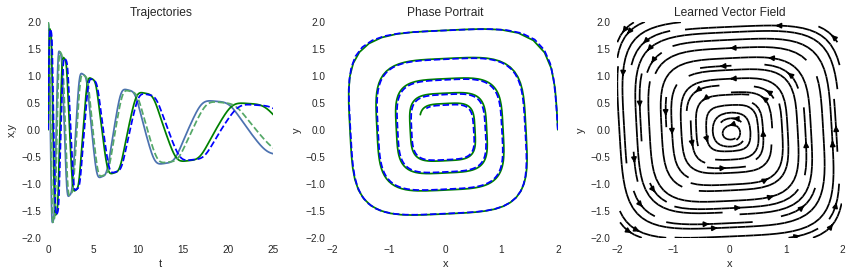

In [0]:
if adjoint:
    from torchdiffeq import odeint_adjoint as odeint
else:
    from torchdiffeq import odeint

device = torch.device('cuda:' + str(gpu) if torch.cuda.is_available() else 'cpu')

true_y0 = torch.tensor([[2., 0.]])
t = torch.linspace(0., 25., data_size)
true_A = torch.tensor([[-0.1, 2.0], [-2.0, -0.1]])


class Lambda(nn.Module):

    def forward(self, t, y):
        return torch.mm(y**3, true_A)


with torch.no_grad():
    true_y = odeint(Lambda(), true_y0, t, method='dopri5')


def get_batch():
    s = torch.from_numpy(np.random.choice(np.arange(data_size - batch_time, dtype=np.int64), batch_size, replace=False))
    batch_y0 = true_y[s]  # (M, D)
    batch_t = t[:batch_time]  # (T)
    batch_y = torch.stack([true_y[s + i] for i in range(batch_time)], dim=0)  # (T, M, D)
    return batch_y0, batch_t, batch_y


def makedirs(dirname):
    if not os.path.exists(dirname):
        os.makedirs(dirname)


if viz:
    makedirs('png')
    import matplotlib.pyplot as plt
    fig = plt.figure(figsize=(12, 4), facecolor='white')
    ax_traj = fig.add_subplot(131, frameon=False)
    ax_phase = fig.add_subplot(132, frameon=False)
    ax_vecfield = fig.add_subplot(133, frameon=False)
    #plt.show(block=False)


def visualize(true_y, pred_y, odefunc, itr):

    if viz:

        ax_traj.cla()
        ax_traj.set_title('Trajectories')
        ax_traj.set_xlabel('t')
        ax_traj.set_ylabel('x,y')
        ax_traj.plot(t.numpy(), true_y.numpy()[:, 0, 0], t.numpy(), true_y.numpy()[:, 0, 1], 'g-')
        ax_traj.plot(t.numpy(), pred_y.numpy()[:, 0, 0], '--', t.numpy(), pred_y.numpy()[:, 0, 1], 'b--')
        ax_traj.set_xlim(t.min(), t.max())
        ax_traj.set_ylim(-2, 2)
        ax_traj.legend()

        ax_phase.cla()
        ax_phase.set_title('Phase Portrait')
        ax_phase.set_xlabel('x')
        ax_phase.set_ylabel('y')
        ax_phase.plot(true_y.numpy()[:, 0, 0], true_y.numpy()[:, 0, 1], 'g-')
        ax_phase.plot(pred_y.numpy()[:, 0, 0], pred_y.numpy()[:, 0, 1], 'b--')
        ax_phase.set_xlim(-2, 2)
        ax_phase.set_ylim(-2, 2)

        ax_vecfield.cla()
        ax_vecfield.set_title('Learned Vector Field')
        ax_vecfield.set_xlabel('x')
        ax_vecfield.set_ylabel('y')

        y, x = np.mgrid[-2:2:21j, -2:2:21j]
        dydt = odefunc(0, torch.Tensor(np.stack([x, y], -1).reshape(21 * 21, 2))).cpu().detach().numpy()
        mag = np.sqrt(dydt[:, 0]**2 + dydt[:, 1]**2).reshape(-1, 1)
        dydt = (dydt / mag)
        dydt = dydt.reshape(21, 21, 2)

        ax_vecfield.streamplot(x, y, dydt[:, :, 0], dydt[:, :, 1], color="black")
        ax_vecfield.set_xlim(-2, 2)
        ax_vecfield.set_ylim(-2, 2)

        fig.tight_layout()
        plt.savefig('png/{:03d}'.format(itr))
        #plt.draw()
        #plt.pause(0.001)


class ODEFunc(nn.Module):

    def __init__(self):
        super(ODEFunc, self).__init__()

        self.net = nn.Sequential(
            nn.Linear(2, 50),
            nn.Tanh(),
            nn.Linear(50, 2),
        )

        for m in self.net.modules():
            if isinstance(m, nn.Linear):
                nn.init.normal_(m.weight, mean=0, std=0.1)
                nn.init.constant_(m.bias, val=0)

    def forward(self, t, y):
        return self.net(y**3)


class RunningAverageMeter(object):
    """Computes and stores the average and current value"""

    def __init__(self, momentum=0.99):
        self.momentum = momentum
        self.reset()

    def reset(self):
        self.val = None
        self.avg = 0

    def update(self, val):
        if self.val is None:
            self.avg = val
        else:
            self.avg = self.avg * self.momentum + val * (1 - self.momentum)
        self.val = val




ii = 0

func = ODEFunc()
optimizer = optim.RMSprop(func.parameters(), lr=1e-3)
end = time.time()

time_meter = RunningAverageMeter(0.97)
loss_meter = RunningAverageMeter(0.97)

for itr in range(1, niters + 1):
  optimizer.zero_grad()
  batch_y0, batch_t, batch_y = get_batch()
  pred_y = odeint(func, batch_y0, batch_t)
  loss = torch.mean(torch.abs(pred_y - batch_y))
  loss.backward()
  optimizer.step()

  time_meter.update(time.time() - end)
  loss_meter.update(loss.item())

  if itr % test_freq == 0:
      with torch.no_grad():
          pred_y = odeint(func, true_y0, t)
          loss = torch.mean(torch.abs(pred_y - true_y))
          print('Iter {:04d} | Total Loss {:.6f}'.format(itr, loss.item()))
          visualize(true_y, pred_y, func, ii)
          ii += 1

  end = time.time()
print('fin')

In [0]:
import imageio

In [0]:
file_names = os.listdir('png')

## First Guess

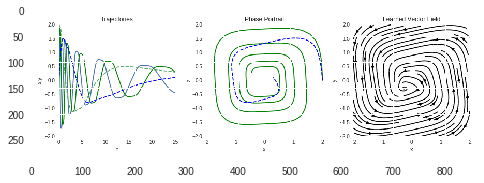

In [0]:
plt.imshow(imageio.imread('png/000.png'))

## Final Guess

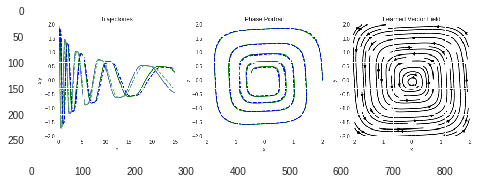

In [0]:
plt.imshow(imageio.imread('png/099.png'))

In [0]:
images = []
for file_name in file_names:
    images.append(imageio.imread('png/' + file_name))
imageio.mimsave('anim_1.gif', images)

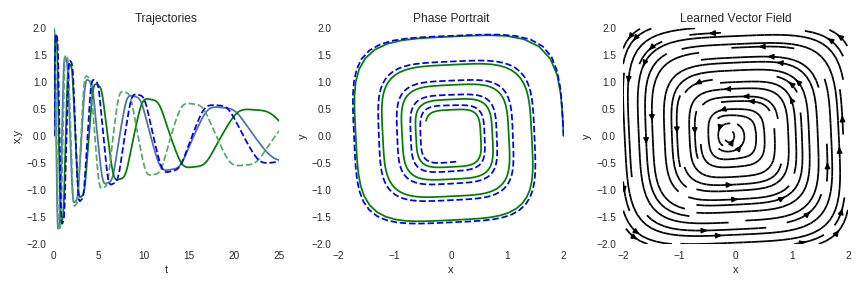

In [0]:
with open('./anim_1.gif','rb') as f:
    display(Image(data=f.read(), format='png'))